# Prediction of the engrgy consummation for buildings in the city of Settle


## Project description


- Prediction  of the engry consumation and the CO2 total emission per building with the help of supervised machine learning models
- Creation of a pipeline for cleaning the data 
- Train different machine learning algorithms 
- Hyperparameters optimization
- Calculation of the importance of each feature
- Using of ensemble algorithm

data source : https://www.kaggle.com/city-of-seattle/sea-building-energy-benchmarking#2015-building-energy-benchmarking.csv

# Import data

In [117]:
!pip install missingno

In [118]:
!pip install eli5

In [119]:
import pandas as pd
import missingno as msno
from sklearn.impute import KNNImputer
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec 
from scipy import stats
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, median_absolute_error 
import statsmodels.api as sm
from statsmodels.formula.api import ols
import folium
from folium.plugins import FastMarkerCluster
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV


We have two datasets, one of the year 2015 and the second from 2016.

In [120]:
# Import data
data_2015 = pd.read_csv('Data/2015-building-energy-benchmarking.csv', sep=',', encoding = 'utf-8')
data_2016 = pd.read_csv('Data/2016-building-energy-benchmarking.csv', sep=',', encoding = 'utf-8')

In [121]:
data_2015.columns

Index(['OSEBuildingID', 'DataYear', 'BuildingType', 'PrimaryPropertyType',
       'PropertyName', 'TaxParcelIdentificationNumber', 'Location',
       'CouncilDistrictCode', 'Neighborhood', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking',
       'PropertyGFABuilding(s)', 'ListOfAllPropertyUseTypes',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA',
       'YearsENERGYSTARCertified', 'ENERGYSTARScore', 'SiteEUI(kBtu/sf)',
       'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)',
       'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kWh)', 'Electricity(kBtu)', 'NaturalGas(therms)',
       'NaturalGas(kBtu)', 'OtherFuelUse(kBtu)',
       'GHGEmissions(MetricTonsCO2e)', 'GHGEmissionsIntensity(kgCO2e/ft2)',
       'DefaultData', '

The datasets containts differents information.Some of the them related directly to the buildings (e.g. building type, the construction year and the other properties). It contains information about the neighborhood, postal code in addition to the different kind of energy consumation (e.g. Electricity, natural gas, steam and other fuels).


In this project the main objectif is to predict the total consumation of energy of the buildings without the help of direct features.

I selected the follow features which seems to be related to our problematic.

In [122]:
#features = ["OSEBuildingID","PropertyName","BuildingType","PrimaryPropertyType", "YearBuilt" , "NumberofFloors" , "PropertyGFATotal" , "NumberofBuildings", "PrimaryPropertyType","LargestPropertyUseTypeGFA", "TotalGHGEmissions", "SiteEnergyUse(kBtu)","NaturalGas(kBtu)","Electricity(kBtu)",'SteamUse(kBtu)','Latitude', 'Longitude',"CouncilDistrictCode"]
features = ["OSEBuildingID","PropertyName","BuildingType","PrimaryPropertyType", "YearBuilt" , "NumberofFloors" , 
            "PropertyGFATotal" , "NumberofBuildings", "PrimaryPropertyType", "TotalGHGEmissions", "SiteEnergyUse(kBtu)",
            "PropertyGFAParking","LargestPropertyUseTypeGFA","LargestPropertyUseType","SecondLargestPropertyUseTypeGFA",
            "NaturalGas(kBtu)","Electricity(kBtu)",'SteamUse(kBtu)','Latitude', 'Longitude',"CouncilDistrictCode"
           ]

data16 = data_2016[features]

In [123]:
data16.head(2)

,OSEBuildingID,PropertyName,BuildingType,PrimaryPropertyType,YearBuilt,NumberofFloors,PropertyGFATotal,NumberofBuildings,PrimaryPropertyType,TotalGHGEmissions,...,PropertyGFAParking,LargestPropertyUseTypeGFA,LargestPropertyUseType,SecondLargestPropertyUseTypeGFA,NaturalGas(kBtu),Electricity(kBtu),SteamUse(kBtu),Latitude,Longitude,CouncilDistrictCode
0,1,Mayflower park hotel,NonResidential,Hotel,1927,12,88434,1.0,Hotel,249.98,...,0,88434.0,Hotel,NaN,1276453.0,3946027.0,2003882.0,47.61220,-122.33799,7
1,2,Paramount Hotel,NonResidential,Hotel,1996,11,103566,1.0,Hotel,295.86,...,15064,83880.0,Hotel,15064.0,5145082.0,3242851.0,0.0,47.61317,-122.33393,7


In [124]:
#features = ["OSEBuildingID","PropertyName","BuildingType", "YearBuilt" , "NumberofFloors","PrimaryPropertyType" , "PropertyGFATotal" , "NumberofBuildings", "PrimaryPropertyType","LargestPropertyUseTypeGFA", "GHGEmissions(MetricTonsCO2e)", "SiteEnergyUse(kBtu)","NaturalGas(kBtu)","Electricity(kBtu)","SteamUse(kBtu)","OtherFuelUse(kBtu)", "CouncilDistrictCode"]

features = ["OSEBuildingID","PropertyName","BuildingType", "YearBuilt" , "NumberofFloors","PrimaryPropertyType" , 
            "PropertyGFATotal" , "NumberofBuildings", "PrimaryPropertyType","LargestPropertyUseTypeGFA","SecondLargestPropertyUseTypeGFA",
            "PropertyGFAParking","LargestPropertyUseTypeGFA","LargestPropertyUseType",
            "GHGEmissions(MetricTonsCO2e)", "SiteEnergyUse(kBtu)","NaturalGas(kBtu)","Electricity(kBtu)","SteamUse(kBtu)","OtherFuelUse(kBtu)", "CouncilDistrictCode"]


data15 = data_2015[features]
data15 = data15.rename(columns={'GHGEmissions(MetricTonsCO2e)': 'TotalGHGEmissions'})
     

In [125]:
data15.head(2)

,OSEBuildingID,PropertyName,BuildingType,YearBuilt,NumberofFloors,PrimaryPropertyType,PropertyGFATotal,NumberofBuildings,PrimaryPropertyType,LargestPropertyUseTypeGFA,...,PropertyGFAParking,LargestPropertyUseTypeGFA,LargestPropertyUseType,TotalGHGEmissions,SiteEnergyUse(kBtu),NaturalGas(kBtu),Electricity(kBtu),SteamUse(kBtu),OtherFuelUse(kBtu),CouncilDistrictCode
0,1,MAYFLOWER PARK HOTEL,NonResidential,1927,12.0,Hotel,88434,1,Hotel,88434.0,...,0,88434.0,Hotel,249.43,6981428.0,1272388.0,3686160.0,2023032.0,0.0,7
1,2,PARAMOUNT HOTEL,NonResidential,1996,11.0,Hotel,103566,1,Hotel,83880.0,...,15064,83880.0,Hotel,263.51,8354235.0,4448985.0,3905411.0,0.0,0.0,7


# Data cleaning

In [126]:
print('The columns available on the 2015 dataset only: \n\n', set(data_2015.columns) - set(data_2016.columns))


The columns available on the 2015 dataset only: 

 {'2010 Census Tracts', 'GHGEmissionsIntensity(kgCO2e/ft2)', 'SPD Beats', 'GHGEmissions(MetricTonsCO2e)', 'Seattle Police Department Micro Community Policing Plan Areas', 'Comment', 'OtherFuelUse(kBtu)', 'City Council Districts', 'Location', 'Zip Codes'}


In [127]:
print('\nThe columns available on the 2016 dataset only: \n\n', set(data_2016.columns) - set(data_2015.columns))


The columns available on the 2016 dataset only: 

 {'TotalGHGEmissions', 'Comments', 'ZipCode', 'Address', 'GHGEmissionsIntensity', 'City', 'Latitude', 'State', 'Longitude'}


### Grouping the two datasets

In [128]:
data15['PropertyName_lower'] = data15['PropertyName'].str.lower()
data16['PropertyName_lower'] = data16['PropertyName'].str.lower()
data15 = pd.merge(data15, data16[['PropertyName_lower','Latitude', 'Longitude']],how="left", on="PropertyName_lower")
data16 = pd.merge(data16, data15[['PropertyName_lower','OtherFuelUse(kBtu)']],how="left", on="PropertyName_lower")


<ipython-input-128-7122b479040b>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data16['PropertyName_lower'] = data16['PropertyName'].str.lower()


In [129]:
data15.shape

(3350, 24)

In [130]:
data16.shape

(3416, 23)

In [131]:
d14, d15 = data15.set_index('OSEBuildingID').align(data16.set_index('OSEBuildingID'), 'inner')

frames = [data15, data16]

#comb_data = pd.concat(frames)
comb_data = d14.append(d15).reset_index()

In [132]:
comb_data.shape

(6720, 26)

In [133]:
comb_data.head(2)

,OSEBuildingID,BuildingType,CouncilDistrictCode,Electricity(kBtu),LargestPropertyUseType,LargestPropertyUseTypeGFA,LargestPropertyUseTypeGFA,Latitude,Longitude,NaturalGas(kBtu),...,PrimaryPropertyType,PropertyGFAParking,PropertyGFATotal,PropertyName,PropertyName_lower,SecondLargestPropertyUseTypeGFA,SiteEnergyUse(kBtu),SteamUse(kBtu),TotalGHGEmissions,YearBuilt
0,1,NonResidential,7,3686160.0,Hotel,88434.0,88434.0,47.61220,-122.33799,1272388.0,...,Hotel,0,88434,MAYFLOWER PARK HOTEL,mayflower park hotel,NaN,6981428.0,2023032.0,249.43,1927
1,2,NonResidential,7,3905411.0,Hotel,83880.0,83880.0,47.61317,-122.33393,4448985.0,...,Hotel,15064,103566,PARAMOUNT HOTEL,paramount hotel,15064.0,8354235.0,0.0,263.51,1996


In [134]:
comb_data = comb_data.loc[:,~comb_data.columns.duplicated()]

In [135]:
comb_data.columns

Index(['OSEBuildingID', 'BuildingType', 'CouncilDistrictCode',
       'Electricity(kBtu)', 'LargestPropertyUseType',
       'LargestPropertyUseTypeGFA', 'Latitude', 'Longitude',
       'NaturalGas(kBtu)', 'NumberofBuildings', 'NumberofFloors',
       'OtherFuelUse(kBtu)', 'PrimaryPropertyType', 'PropertyGFAParking',
       'PropertyGFATotal', 'PropertyName', 'PropertyName_lower',
       'SecondLargestPropertyUseTypeGFA', 'SiteEnergyUse(kBtu)',
       'SteamUse(kBtu)', 'TotalGHGEmissions', 'YearBuilt'],
      dtype='object')

### Data featuring

#### Target variables 
 
The target features that we try to predict are :

    - CO2 total emission "TotalGHGEmissions"
    - Total energy consumation "SiteEnergyUseWN(kBtu)"
    
Without taking in consideration the directly energy-related feautres:

- SiteEUI(kBtu/sf)
- SiteEUIWN(kBtu/sf) 
- SourceEUI(kBtu/sf) 
- SourceEUIWN(kBtu/sf) 
- SiteEnergyUse(kBtu) 
- SiteEnergyUseWN(kBtu) 
- SteamUse(kBtu) 
- thermal units (kBtu).
- Electricity(kWh) 
- Electricity(kBtu) 
- NaturalGas(therms)
- NaturalGas(kBtu)
- OtherFuelUse(kBtu)


#### Identify potential information

Here is the list of features which could help us in our goal:
    
    - The building type "BuildingType" 
    - The year where the building is built "YearBuilt"
    - The number of floors "NumberofFloors"
    - Total Gross floor area "PropertyGFATotal"
    - Number of properties "NumberofBuildings"
    - The type of the primary property "PrimaryPropertyType"
    - The largest property "LargestPropertyUseTypeGFA"	
    

*Comb = combiend

In [136]:

comb_data["useElectricity"] = np.where(comb_data["Electricity(kBtu)"].isnull() |
                                           comb_data["Electricity(kBtu)"] == 0, 0, 1)

comb_data["useNaturalGas"] = np.where(comb_data["NaturalGas(kBtu)"].isnull() |
                                          comb_data["NaturalGas(kBtu)"] ==0, 0, 1)

comb_data["useSteam"] = np.where(comb_data["SteamUse(kBtu)"].isnull() |
                                     comb_data["SteamUse(kBtu)"] == 0, 0, 1)

comb_data["useOtherFuel"] = np.where(comb_data["OtherFuelUse(kBtu)"].isnull() |
                                         comb_data["OtherFuelUse(kBtu)"] == 0, 0, 1)


In [137]:
comb_data.drop(['Electricity(kBtu)','NaturalGas(kBtu)','SteamUse(kBtu)','OtherFuelUse(kBtu)'], axis=1,inplace =True)


In [138]:
comb_data.sample(2)

,OSEBuildingID,BuildingType,CouncilDistrictCode,LargestPropertyUseType,LargestPropertyUseTypeGFA,Latitude,Longitude,NumberofBuildings,NumberofFloors,PrimaryPropertyType,...,PropertyName,PropertyName_lower,SecondLargestPropertyUseTypeGFA,SiteEnergyUse(kBtu),TotalGHGEmissions,YearBuilt,useElectricity,useNaturalGas,useSteam,useOtherFuel
1948,23761,Multifamily LR (1-4),6,Multifamily Housing,24589.0,NaN,NaN,1.0,3.0,Low-Rise Multifamily,...,SKANDIA WEST CONDOMINIUM,skandia west condominium,NaN,932514.0,18.99,1997,1,1,0,0
5415,24138,Multifamily LR (1-4),2,Multifamily Housing,121635.0,47.54027,-122.28551,1.0,3.0,Low-Rise Multifamily,...,Park Place Assisted Living,park place assisted living,NaN,7308538.0,160.80,2001,1,1,0,1


### Delete of duplicated values

In [139]:
comb_data.shape

(6720, 22)

In [140]:
comb_data = comb_data.drop_duplicates(subset =['PropertyName_lower','SiteEnergyUse(kBtu)','TotalGHGEmissions'], keep ='first')


In [141]:
comb_data.sort_values('OSEBuildingID').head(3).sample(10, replace=True)

,OSEBuildingID,BuildingType,CouncilDistrictCode,LargestPropertyUseType,LargestPropertyUseTypeGFA,Latitude,Longitude,NumberofBuildings,NumberofFloors,PrimaryPropertyType,...,PropertyName,PropertyName_lower,SecondLargestPropertyUseTypeGFA,SiteEnergyUse(kBtu),TotalGHGEmissions,YearBuilt,useElectricity,useNaturalGas,useSteam,useOtherFuel
3360,1,NonResidential,7,Hotel,88434.0,47.61220,-122.33799,1.0,12.0,Hotel,...,Mayflower park hotel,mayflower park hotel,NaN,7226362.5,249.98,1927,1,1,1,0
3360,1,NonResidential,7,Hotel,88434.0,47.61220,-122.33799,1.0,12.0,Hotel,...,Mayflower park hotel,mayflower park hotel,NaN,7226362.5,249.98,1927,1,1,1,0
0,1,NonResidential,7,Hotel,88434.0,47.61220,-122.33799,1.0,12.0,Hotel,...,MAYFLOWER PARK HOTEL,mayflower park hotel,NaN,6981428.0,249.43,1927,1,1,1,0
3360,1,NonResidential,7,Hotel,88434.0,47.61220,-122.33799,1.0,12.0,Hotel,...,Mayflower park hotel,mayflower park hotel,NaN,7226362.5,249.98,1927,1,1,1,0
1,2,NonResidential,7,Hotel,83880.0,47.61317,-122.33393,1.0,11.0,Hotel,...,PARAMOUNT HOTEL,paramount hotel,15064.0,8354235.0,263.51,1996,1,1,0,0
1,2,NonResidential,7,Hotel,83880.0,47.61317,-122.33393,1.0,11.0,Hotel,...,PARAMOUNT HOTEL,paramount hotel,15064.0,8354235.0,263.51,1996,1,1,0,0
1,2,NonResidential,7,Hotel,83880.0,47.61317,-122.33393,1.0,11.0,Hotel,...,PARAMOUNT HOTEL,paramount hotel,15064.0,8354235.0,263.51,1996,1,1,0,0
1,2,NonResidential,7,Hotel,83880.0,47.61317,-122.33393,1.0,11.0,Hotel,...,PARAMOUNT HOTEL,paramount hotel,15064.0,8354235.0,263.51,1996,1,1,0,0
0,1,NonResidential,7,Hotel,88434.0,47.61220,-122.33799,1.0,12.0,Hotel,...,MAYFLOWER PARK HOTEL,mayflower park hotel,NaN,6981428.0,249.43,1927,1,1,1,0
3360,1,NonResidential,7,Hotel,88434.0,47.61220,-122.33799,1.0,12.0,Hotel,...,Mayflower park hotel,mayflower park hotel,NaN,7226362.5,249.98,1927,1,1,1,0


In [142]:
comb_data.shape

(6567, 22)

### Missing values

In [143]:
msno.bar(comb_data)

<AxesSubplot:>

In [144]:
comb_data.isna().sum().sum

<bound method NDFrame._add_numeric_operations.<locals>.sum of OSEBuildingID                         0
BuildingType                          0
CouncilDistrictCode                   0
LargestPropertyUseType              136
LargestPropertyUseTypeGFA           136
Latitude                           2399
Longitude                          2399
NumberofBuildings                     6
NumberofFloors                        8
PrimaryPropertyType                   0
PropertyGFAParking                    0
PropertyGFATotal                      0
PropertyName                          0
PropertyName_lower                    0
SecondLargestPropertyUseTypeGFA    3401
SiteEnergyUse(kBtu)                  12
TotalGHGEmissions                    15
YearBuilt                             0
useElectricity                        0
useNaturalGas                         0
useSteam                              0
useOtherFuel                          0
dtype: int64>

In [145]:
#remplacement des "faux NaN" en NaN de pandas
#Replacing the false "Nan" with Pandas Nan
comb_data = comb_data.replace(to_replace = '^nan$', value = np.nan, regex=True)

#Impute missing value with mean
comb_data = comb_data.fillna(comb_data.mean()) 

In [146]:
comb_data.isna().sum().sum

<bound method NDFrame._add_numeric_operations.<locals>.sum of OSEBuildingID                        0
BuildingType                         0
CouncilDistrictCode                  0
LargestPropertyUseType             136
LargestPropertyUseTypeGFA            0
Latitude                             0
Longitude                            0
NumberofBuildings                    0
NumberofFloors                       0
PrimaryPropertyType                  0
PropertyGFAParking                   0
PropertyGFATotal                     0
PropertyName                         0
PropertyName_lower                   0
SecondLargestPropertyUseTypeGFA      0
SiteEnergyUse(kBtu)                  0
TotalGHGEmissions                    0
YearBuilt                            0
useElectricity                       0
useNaturalGas                        0
useSteam                             0
useOtherFuel                         0
dtype: int64>

### Outliers

In [147]:
def delete_outliers_percentiles(df):
    '''Suppression des outliers du centile extrême'''
    Q1 = df.quantile(0.1)
    Q3 = df.quantile(0.9)
    IQR = Q3 - Q1

    return df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]

In [148]:
comb_data.shape

(6567, 22)

In [149]:
clean_data = delete_outliers_percentiles(comb_data)

<ipython-input-147-d1a01ce3bf77>:7: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version.  Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  return df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]
<ipython-input-147-d1a01ce3bf77>:7: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version.  Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  return df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]


In [150]:
clean_data.shape

(5570, 22)

In [151]:
clean_data.head(3)

,OSEBuildingID,BuildingType,CouncilDistrictCode,LargestPropertyUseType,LargestPropertyUseTypeGFA,Latitude,Longitude,NumberofBuildings,NumberofFloors,PrimaryPropertyType,...,PropertyName,PropertyName_lower,SecondLargestPropertyUseTypeGFA,SiteEnergyUse(kBtu),TotalGHGEmissions,YearBuilt,useElectricity,useNaturalGas,useSteam,useOtherFuel
1,2,NonResidential,7,Hotel,83880.0,47.613170,-122.333930,1.0,11.0,Hotel,...,PARAMOUNT HOTEL,paramount hotel,15064.000000,8354235.0,263.51,1996,1,1,0,0
5,9,Nonresidential COS,7,Police Station,88830.0,47.623444,-122.334846,1.0,2.0,Other,...,WEST PRECINCT (SEATTLE POLICE),west precinct (seattle police),27677.503884,12051984.0,304.62,1999,1,1,0,0
6,10,NonResidential,7,Hotel,81352.0,47.623444,-122.334846,1.0,11.0,Hotel,...,CAMLIN WORLDMARK HOTEL,camlin worldmark hotel,27677.503884,6252842.0,208.46,1926,1,1,0,0


# Exploratory data analysis (EDA)

## Univariate analysis

In [152]:
clean_data.head(3)

,OSEBuildingID,BuildingType,CouncilDistrictCode,LargestPropertyUseType,LargestPropertyUseTypeGFA,Latitude,Longitude,NumberofBuildings,NumberofFloors,PrimaryPropertyType,...,PropertyName,PropertyName_lower,SecondLargestPropertyUseTypeGFA,SiteEnergyUse(kBtu),TotalGHGEmissions,YearBuilt,useElectricity,useNaturalGas,useSteam,useOtherFuel
1,2,NonResidential,7,Hotel,83880.0,47.613170,-122.333930,1.0,11.0,Hotel,...,PARAMOUNT HOTEL,paramount hotel,15064.000000,8354235.0,263.51,1996,1,1,0,0
5,9,Nonresidential COS,7,Police Station,88830.0,47.623444,-122.334846,1.0,2.0,Other,...,WEST PRECINCT (SEATTLE POLICE),west precinct (seattle police),27677.503884,12051984.0,304.62,1999,1,1,0,0
6,10,NonResidential,7,Hotel,81352.0,47.623444,-122.334846,1.0,11.0,Hotel,...,CAMLIN WORLDMARK HOTEL,camlin worldmark hotel,27677.503884,6252842.0,208.46,1926,1,1,0,0


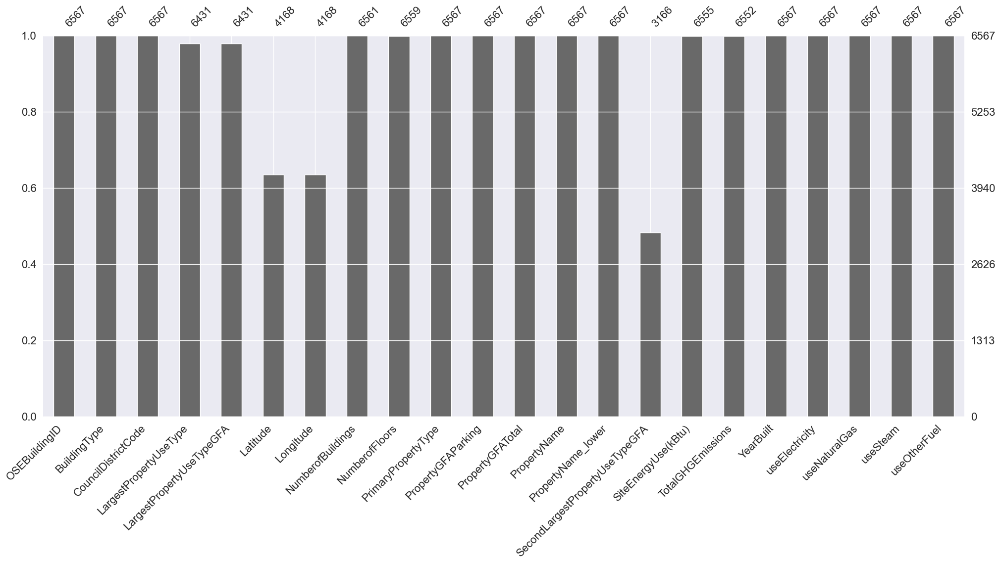

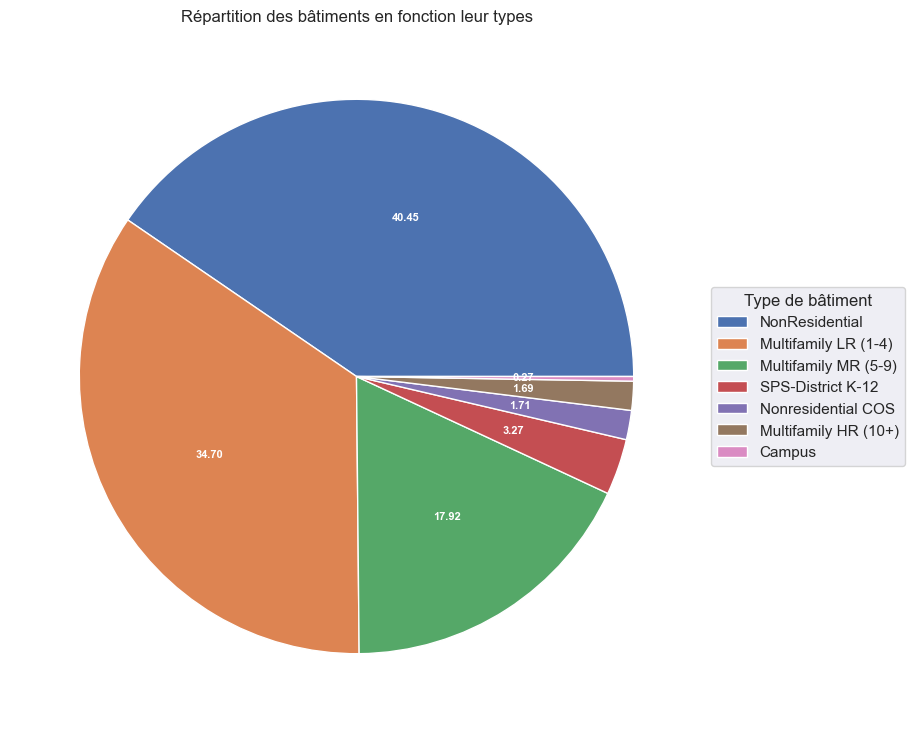

In [153]:
fig, ax = plt.subplots(figsize=(18, 9), subplot_kw=dict(aspect="equal"))

viz =clean_data["BuildingType"].value_counts()
category_prod = viz.index





wedges, texts, autotexts = ax.pie(viz, autopct='%.2f',
                                  textprops=dict(color="w"))

ax.legend(wedges, category_prod,
          title="Type de bâtiment",
          loc="center left",
          bbox_to_anchor=(1, 0, 0.5, 1))

plt.setp(autotexts, size=8, weight="bold")

ax.set_title("Répartition des bâtiments en fonction leur types")

plt.show()

As we can see, the non residentail buildings represent the major part of our data. Multifamily residences come at the second place. I will split the data into two types (residential and no-residential builings).


In [154]:
residential = ['Multifamily LR (1-4)','Multifamily HR (10+)','Multifamily MR (5-9)']
residential_buildings = clean_data[clean_data['BuildingType'].isin(residential)]

nonResidentialBuilding = clean_data[~clean_data['BuildingType'].isin(residential)]
nonResidentialBuilding.sample(5)

,OSEBuildingID,BuildingType,CouncilDistrictCode,LargestPropertyUseType,LargestPropertyUseTypeGFA,Latitude,Longitude,NumberofBuildings,NumberofFloors,PrimaryPropertyType,...,PropertyName,PropertyName_lower,SecondLargestPropertyUseTypeGFA,SiteEnergyUse(kBtu),TotalGHGEmissions,YearBuilt,useElectricity,useNaturalGas,useSteam,useOtherFuel
2777,26720,NonResidential,7,Non-Refrigerated Warehouse,26416.000000,47.623444,-122.334846,1.0,4.0,Non-Refrigerated Warehouse,...,SEATTLE LIGHTING FIXTURE COMPANY,seattle lighting fixture company,9531.000000,1580597.0,11.02,1906,1,0,0,0
2447,25513,NonResidential,3,Worship Facility,21850.000000,47.623444,-122.334846,1.0,1.0,Worship Facility,...,ST THERESE PARISH,st therese parish,27677.503884,316217.0,12.75,1900,1,1,0,0
379,513,NonResidential,7,NaN,75165.096253,47.623444,-122.334846,1.0,3.0,Small- and Mid-Sized Office,...,KCPQ,kcpq,27677.503884,9109967.0,63.51,1952,1,0,0,0
2465,25553,NonResidential,7,Hotel,25450.000000,47.623444,-122.334846,1.0,3.0,Hotel,...,J & M HOTEL BUILDING,j & m hotel building,27677.503884,497556.0,3.47,1900,1,0,0,0
2752,26611,NonResidential,2,Medical Office,25880.000000,47.623444,-122.334846,1.0,2.0,Medical Office,...,NEIGHBORCARE HEALTH MEDICAL CLINIC,neighborcare health medical clinic,27677.503884,1838121.0,21.78,2010,1,1,0,0


### Building type

In [155]:
def histoCategVariable(data,column,rotation):
    Counts = data[column].value_counts() 
    Types = Counts.index
    
    postionofbars = list(range(len(Types)))
    plt.figure(figsize=(10, 5))
    plt.bar(postionofbars,Counts,)
    plt.xticks(postionofbars,Types, rotation= rotation)
    plt.show()

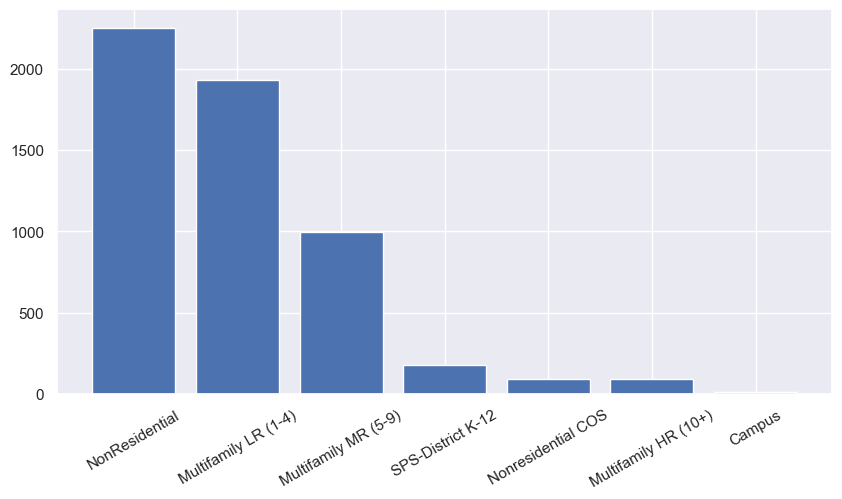

In [156]:
histoCategVariable(clean_data, "BuildingType", 30 )

### The largest primary property

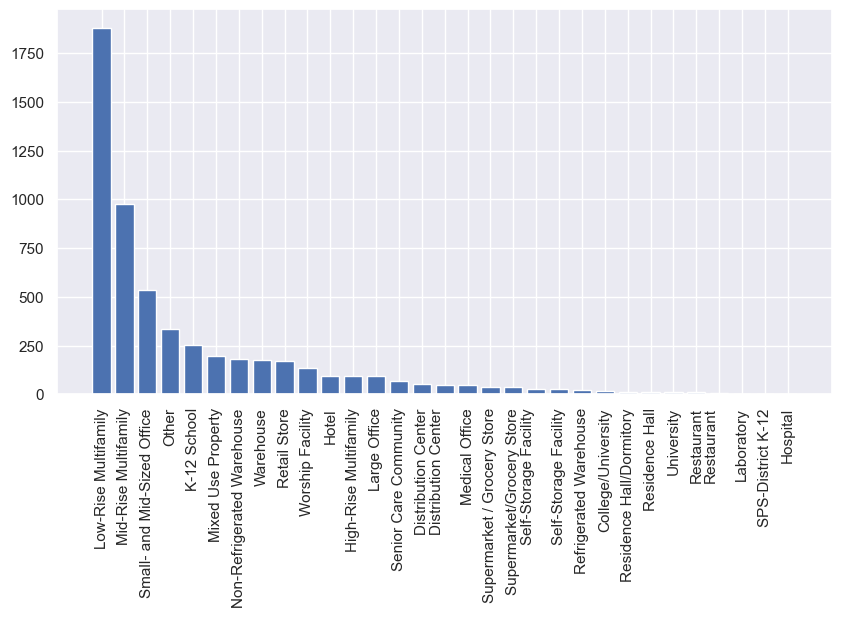

In [157]:
histoCategVariable(clean_data,"PrimaryPropertyType", 90)

<b> For the non-residential buildings: </b>

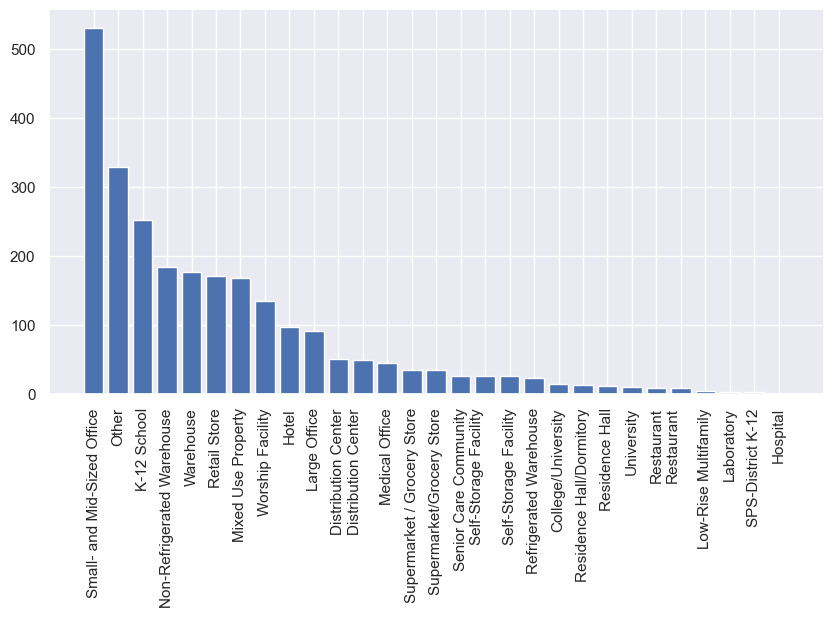

In [158]:
histoCategVariable(nonResidentialBuilding,"PrimaryPropertyType", 90)

In [159]:
def two_chart_plot(df, feature):
    fig = plt.figure(constrained_layout = True, figsize = (12, 8))
    grid = gridspec.GridSpec(ncols = 3, nrows = 3, figure = fig)
    
    ax1 = fig.add_subplot(grid[0, :2])
    ax1.set_title('Histogram')
    
    sns.distplot(df.loc[:, feature], norm_hist = True, ax = ax1)
    plt.axvline(x = df[feature].mean(), c = 'red')
    plt.axvline(x = df[feature].median(), c = 'green')

    ## Customizing the Box Plot. 
    ax3 = fig.add_subplot(grid[:, 2])
    ## Set title. 
    ax3.set_title('Box Plot')
    sns.boxplot(df.loc[:,feature], orient = 'v', ax = ax3 )
    plt.show()

### Building year

In [160]:
yearBuilt = clean_data[['OSEBuildingID','PropertyName','YearBuilt']]
yearBuilt.head(5)

,OSEBuildingID,PropertyName,YearBuilt
1,2,PARAMOUNT HOTEL,1996
5,9,WEST PRECINCT (SEATTLE POLICE),1999
6,10,CAMLIN WORLDMARK HOTEL,1926
8,12,COURTYARD BY MARRIOTT - ALASKA BLDG SEATTLE,1904
22,28,GRAHAM HILL ELEMENTARY SCHOOL (SPS-DISTRICT),1961


D:\Anconda\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\Anconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
D:\Anconda\lib\site-packages\seaborn\_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))


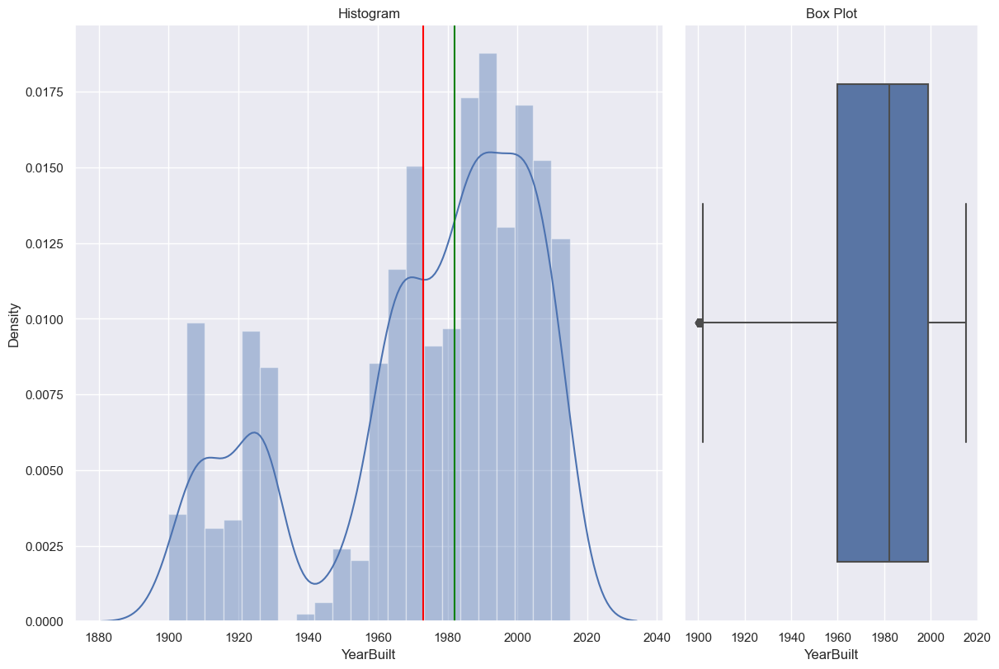

In [161]:
two_chart_plot(residential_buildings,'YearBuilt')

<b> For the non-residential buildings : </b>

In [162]:
nonResYearBuilt = nonResidentialBuilding[['OSEBuildingID','PropertyName','YearBuilt']]

D:\Anconda\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\Anconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
D:\Anconda\lib\site-packages\seaborn\_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))


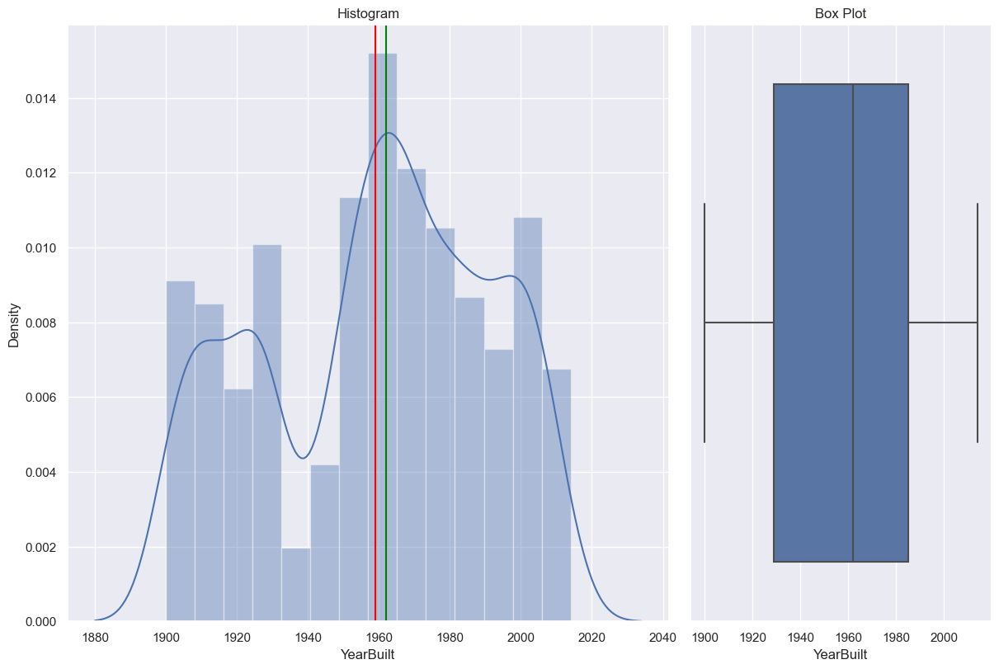

In [163]:
two_chart_plot(nonResYearBuilt,'YearBuilt')

### Floors number

In [164]:
numberFloors = clean_data[['OSEBuildingID','PropertyName','NumberofFloors']]

D:\Anconda\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\Anconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
D:\Anconda\lib\site-packages\seaborn\_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))


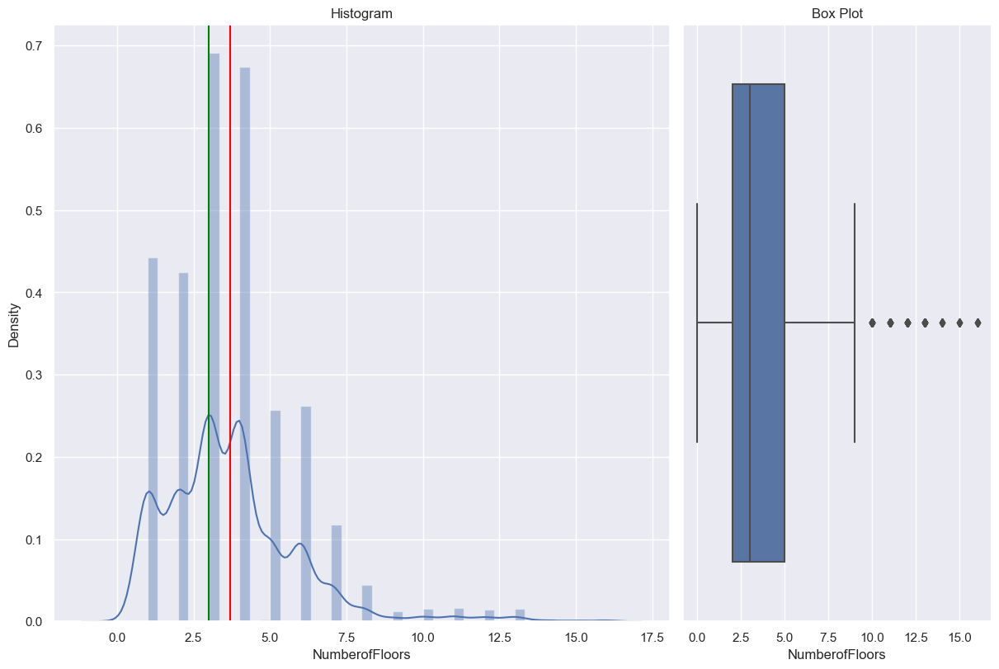

In [165]:
two_chart_plot(clean_data,'NumberofFloors')

### Total Surface 

In [166]:
surfaceTotal = clean_data[['OSEBuildingID','PropertyName', 'PropertyGFATotal']]

In [167]:
surfaceTotal.sample(5)

,OSEBuildingID,PropertyName,PropertyGFATotal
5427,24172,Les Schwab Tire Center #396,20738
4354,20396,Meaves Building,33300
2331,25111,SIERRA ON GREENWOOD APTS,28190
2821,26847,NIPPON KAN/KOBE PARK BUILDING,31432
4373,20440,SK Food Group,43387


D:\Anconda\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\Anconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
D:\Anconda\lib\site-packages\seaborn\_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))


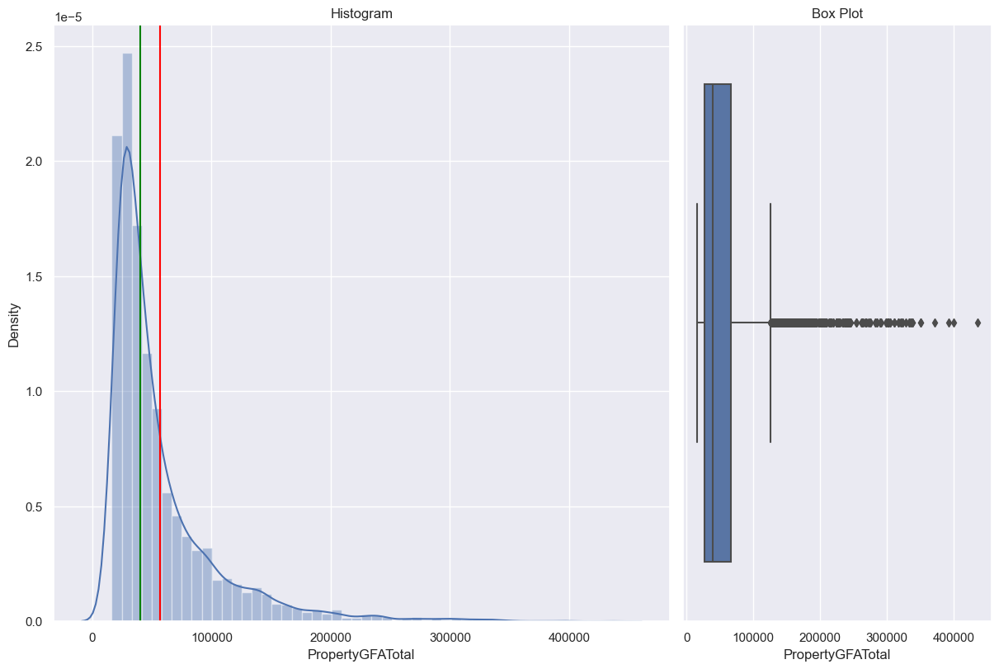

In [168]:
two_chart_plot(clean_data,"PropertyGFATotal")

### Property buildings

In [169]:
nombrePropriete = clean_data[['OSEBuildingID','PropertyName','NumberofBuildings']]

In [170]:
nombrePropriete.sample(5)

,OSEBuildingID,PropertyName,NumberofBuildings
4711,21539,Borealis,1.0
4290,20210,Brix Condominium,1.0
3308,49895,SQUARE ONE APARTMENTS,1.0
1645,22850,GREEN LAKE CONDOMINIUM,1.0
2626,26129,MORRIS APTS,1.0


D:\Anconda\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\Anconda\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
D:\Anconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
D:\Anconda\lib\site-packages\seaborn\_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))


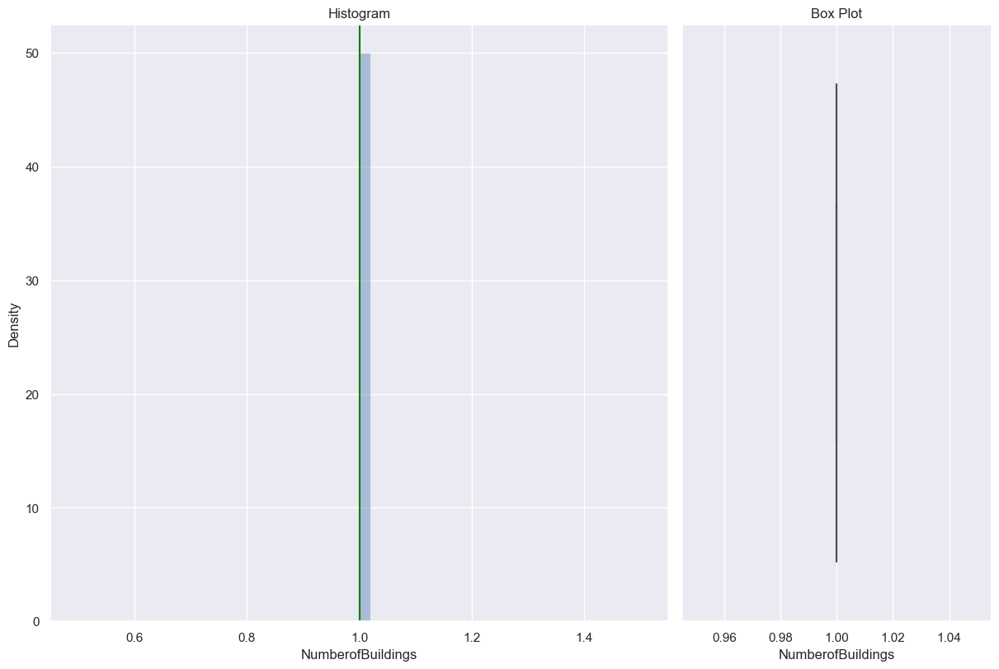

In [171]:
two_chart_plot(nombrePropriete,"NumberofBuildings")

### Plus Grande Surface

In [172]:
grandeProp = clean_data[['OSEBuildingID','PropertyName','LargestPropertyUseTypeGFA']]

In [173]:
grandeProp.sample(5)

,OSEBuildingID,PropertyName,LargestPropertyUseTypeGFA
5788,25432,Dolphin Apartments,24696.0
183,292,"MARSHALL, JOHN (SPS-DISTRICT)",92437.0
4716,21550,Bayview Building,45864.0
5355,23935,Messenger Corp,32000.0
1046,20531,RED CROSS,35500.0


D:\Anconda\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\Anconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
D:\Anconda\lib\site-packages\seaborn\_core.py:1303: UserWarning: Vertical orientation ignored with only `x` specified.
  warnings.warn(single_var_warning.format("Vertical", "x"))


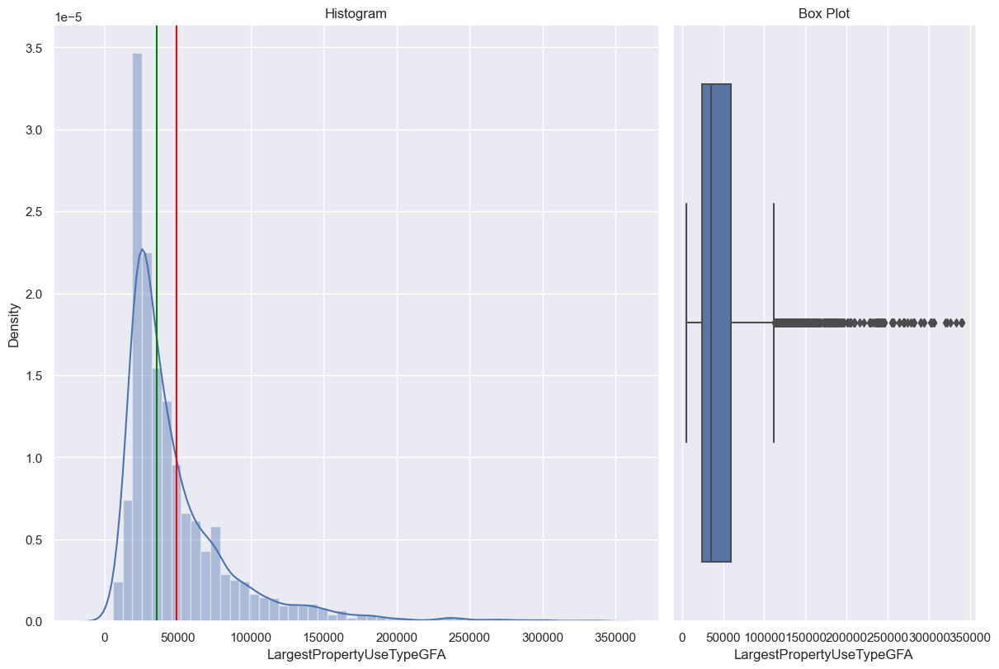

In [174]:
two_chart_plot(grandeProp,"LargestPropertyUseTypeGFA")

## Bivariate anaylsis

### Bulidings type Vs CO2 Emission   


In [175]:
comb_data.columns

Index(['OSEBuildingID', 'BuildingType', 'CouncilDistrictCode',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA', 'Latitude',
       'Longitude', 'NumberofBuildings', 'NumberofFloors',
       'PrimaryPropertyType', 'PropertyGFAParking', 'PropertyGFATotal',
       'PropertyName', 'PropertyName_lower', 'SecondLargestPropertyUseTypeGFA',
       'SiteEnergyUse(kBtu)', 'TotalGHGEmissions', 'YearBuilt',
       'useElectricity', 'useNaturalGas', 'useSteam', 'useOtherFuel'],
      dtype='object')

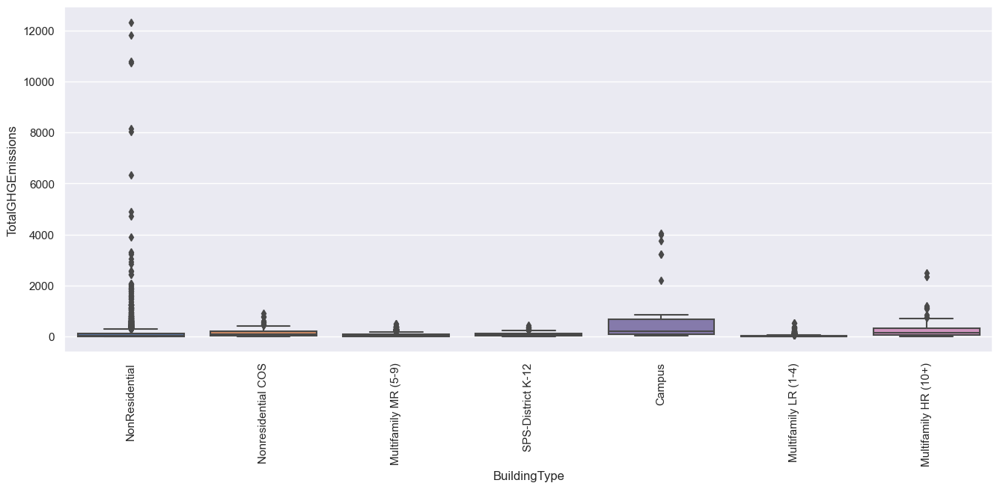

In [176]:
plt.figure(figsize=(16, 6))
ax = sns.boxplot(x=comb_data['BuildingType'], y=comb_data['TotalGHGEmissions'])
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
plt.show()

<b> After the cleaning of the data </b>

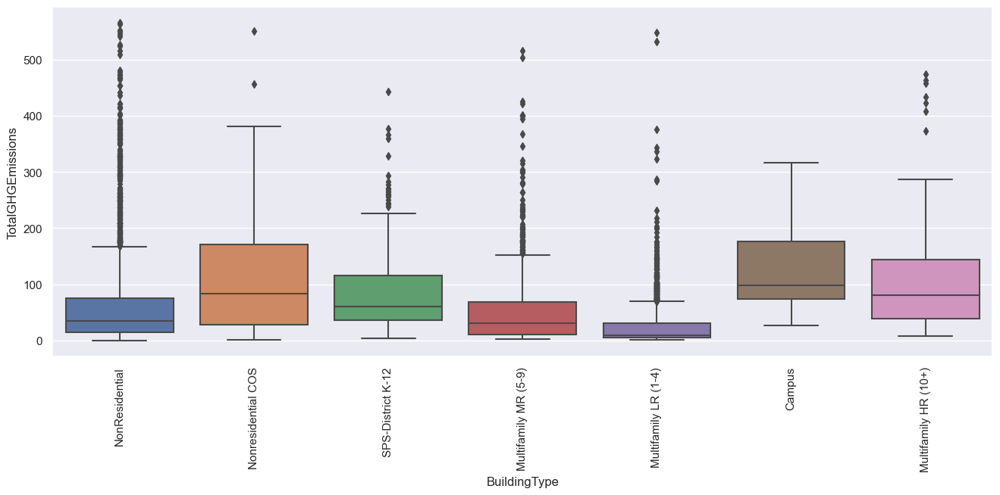

In [177]:
plt.figure(figsize=(16, 6))
ax = sns.boxplot(x=clean_data['BuildingType'], y=clean_data['TotalGHGEmissions'])
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
plt.show()

<b> Anova Emission totale de CO2 Vs Type de batîments </b>

In [178]:
model = ols('Q("TotalGHGEmissions") ~ BuildingType', data=clean_data).fit()
aov_table = sm.stats.anova_lm(model, typ=2)
aov_table

,sum_sq,df,F,PR(>F)
BuildingType,2.943801e+06,6.0,92.101055,1.255199e-110
Residual,2.963478e+07,5563.0,NaN,NaN


### Building type VS Total energy consumation

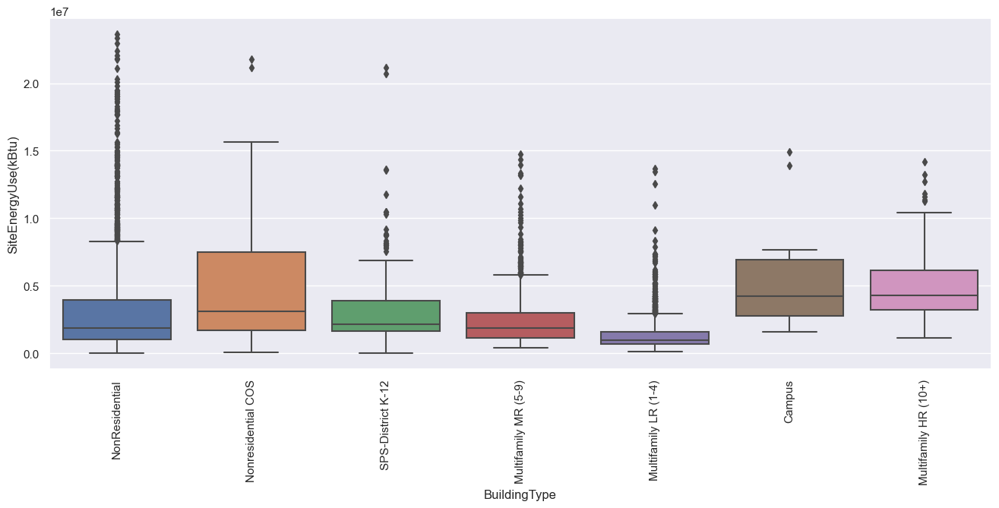

In [179]:
plt.figure(figsize=(16, 6))
ax = sns.boxplot(x=clean_data['BuildingType'], y=clean_data['SiteEnergyUse(kBtu)'])
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
plt.show()

<b> Anova le type de batîment et la consumation d'énergie  </b>

In [180]:
model = ols('Q("SiteEnergyUse(kBtu)") ~ BuildingType', data=clean_data).fit()
aov_table = sm.stats.anova_lm(model, typ=2)
aov_table

,sum_sq,df,F,PR(>F)
BuildingType,5.382898e+15,6.0,118.52475,2.386388e-141
Residual,4.210803e+16,5563.0,NaN,NaN


### Type of the largest property Vs total energy consumation

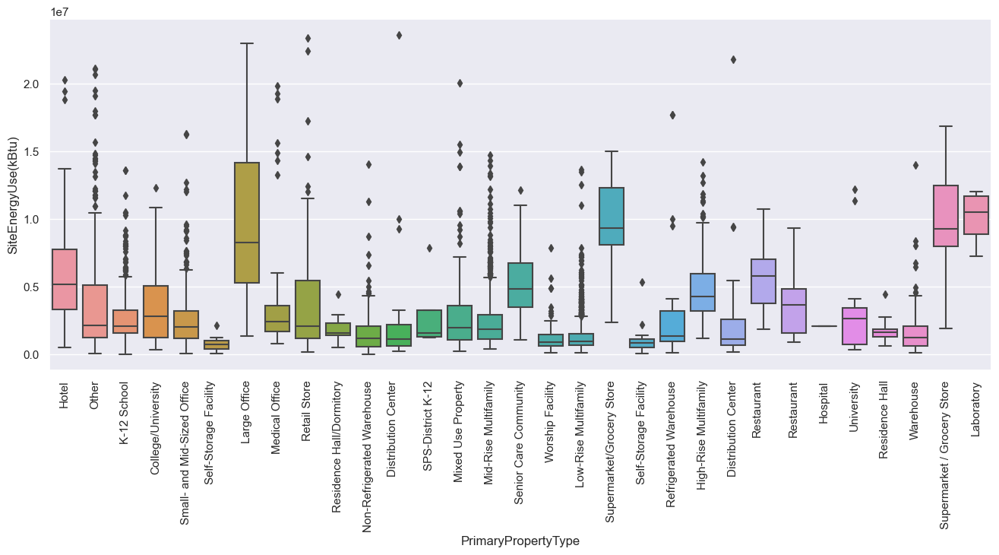

In [181]:
plt.figure(figsize=(16, 6))
ax = sns.boxplot(x=clean_data['PrimaryPropertyType'], y=clean_data['SiteEnergyUse(kBtu)'])
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
plt.show()

## Multivariate analysis

### Correlation matrix

In [182]:
clean_data.dtypes

OSEBuildingID                        int64
BuildingType                        object
CouncilDistrictCode                  int64
LargestPropertyUseType              object
LargestPropertyUseTypeGFA          float64
Latitude                           float64
Longitude                          float64
NumberofBuildings                  float64
NumberofFloors                     float64
PrimaryPropertyType                 object
PropertyGFAParking                   int64
PropertyGFATotal                     int64
PropertyName                        object
PropertyName_lower                  object
SecondLargestPropertyUseTypeGFA    float64
SiteEnergyUse(kBtu)                float64
TotalGHGEmissions                  float64
YearBuilt                            int64
useElectricity                       int32
useNaturalGas                        int32
useSteam                             int32
useOtherFuel                         int32
dtype: object

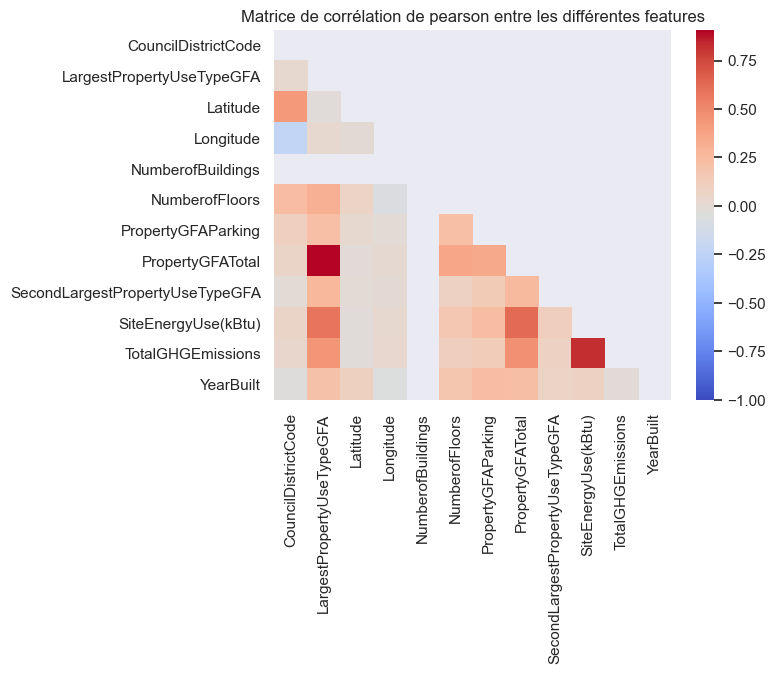

In [183]:
sns.set(font_scale=1)
plt.title('Matrice de corrélation de pearson entre les différentes features')

# Skip first column Building Id
clean_data = clean_data.iloc[:, 1:]
numeric_columns = clean_data.select_dtypes(include = ['int64','float64']).columns

corr = clean_data[numeric_columns].corr()

mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True 

ax = sns.heatmap(corr, mask=mask, vmin=-1, cmap='coolwarm')
plt.show()
sns.set(font_scale=1)

<b> For non residential buildings : </b>


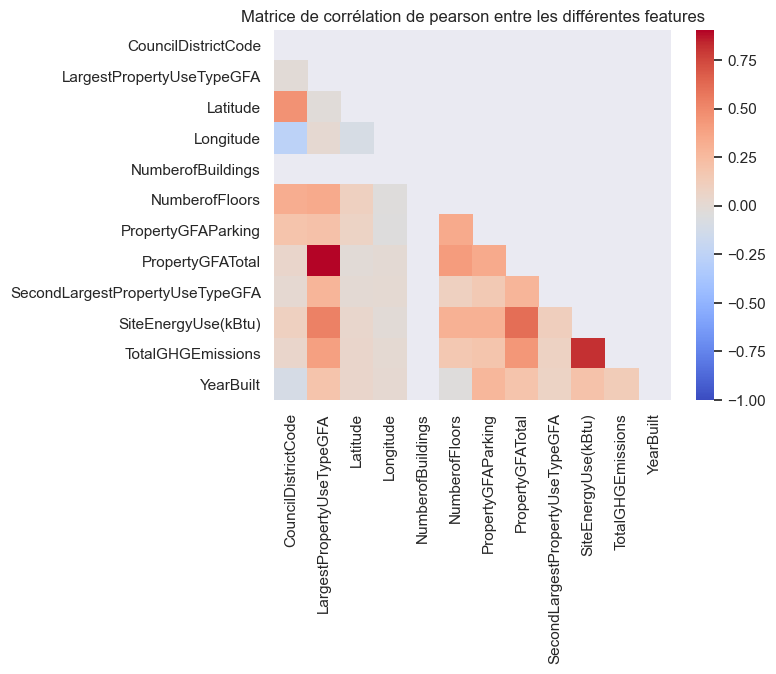

In [184]:
sns.set(font_scale=1)
plt.title('Matrice de corrélation de pearson entre les différentes features')

# Skip first column Building Id
nonResidentialBuilding = nonResidentialBuilding.iloc[:, 1:]
numeric_columns = nonResidentialBuilding.select_dtypes(include = ['int64','float64']).columns

corr = nonResidentialBuilding[numeric_columns].corr()

mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True 

ax = sns.heatmap(corr, mask=mask, vmin=-1, cmap='coolwarm')
plt.show()
sns.set(font_scale=1)

The observation of correlation matrix:
    
    - Buildings number has no correlation with the other features, so it could be deleted
    - Property total surface and the largest property are postively correlated, so we can pick one of them without information losing 
    - The CO2 emission and the total energy consumation are postively correlated but we can not delete them as they are the target feature. We will develop two separte models to predict them

 # Map

I create an interactive map to give an overview of the city. It allows us to easily the parts of the city that consume the most of the energy. The circle presented in the map are the buildings and raduis increase proportionally with the energy consumation.

In [185]:
folium_map = folium.Map(location=[47.608013, -122.335167],
                        zoom_start=11,
                        tiles='CartoDB dark_matter')

for index, row in clean_data[clean_data['Latitude'].notnull() &clean_data['Longitude'].notnull()].iterrows():

    # generate the popup message that is shown on click.
    popup_text = row["PropertyName"]
   

    folium.CircleMarker(location=(row["Latitude"],
                                  row["Longitude"]),
                        radius= row['SiteEnergyUse(kBtu)']/1000000,
                        color="#E37222",
                        popup=popup_text,
                        fill=False).add_to(folium_map)
folium_map

# Predictif phase

In [186]:
buildings = comb_data
buildings = buildings.drop(['PropertyName','PropertyName_lower','OSEBuildingID'],axis=1)
buildings.head(3)

,BuildingType,CouncilDistrictCode,LargestPropertyUseType,LargestPropertyUseTypeGFA,Latitude,Longitude,NumberofBuildings,NumberofFloors,PrimaryPropertyType,PropertyGFAParking,PropertyGFATotal,SecondLargestPropertyUseTypeGFA,SiteEnergyUse(kBtu),TotalGHGEmissions,YearBuilt,useElectricity,useNaturalGas,useSteam,useOtherFuel
0,NonResidential,7,Hotel,88434.0,47.612200,-122.337990,1.0,12.0,Hotel,0,88434,27677.503884,6981428.0,249.43,1927,1,1,1,0
1,NonResidential,7,Hotel,83880.0,47.613170,-122.333930,1.0,11.0,Hotel,15064,103566,15064.000000,8354235.0,263.51,1996,1,1,0,0
2,NonResidential,7,Hotel,757243.0,47.623444,-122.334846,1.0,41.0,Hotel,0,961990,100000.000000,73130656.0,2061.48,1969,1,1,1,0


In [187]:
buildings.shape

(6567, 19)

In [188]:
buildings.dtypes

BuildingType                        object
CouncilDistrictCode                  int64
LargestPropertyUseType              object
LargestPropertyUseTypeGFA          float64
Latitude                           float64
Longitude                          float64
NumberofBuildings                  float64
NumberofFloors                     float64
PrimaryPropertyType                 object
PropertyGFAParking                   int64
PropertyGFATotal                     int64
SecondLargestPropertyUseTypeGFA    float64
SiteEnergyUse(kBtu)                float64
TotalGHGEmissions                  float64
YearBuilt                            int64
useElectricity                       int32
useNaturalGas                        int32
useSteam                             int32
useOtherFuel                         int32
dtype: object

In [189]:
categorical_feature_mask = buildings.dtypes==object
categorical_cols = buildings.columns[categorical_feature_mask].tolist()
categorical_cols

['BuildingType', 'LargestPropertyUseType', 'PrimaryPropertyType']

## OneHotEncoder

As machine learning model can not handle textual (categorical) data. We need to encode (convert to numerical values) them.

In [190]:
# from sklearn.preprocessing import LabelEncoder
# le = LabelEncoder()

In [191]:
# final = buildings

# final[categorical_cols] = final[categorical_cols].apply(lambda col: le.fit_transform(col.astype(str)))

In [192]:
# final.head(2)

In [193]:
# y = buildings.TotalGHGEmissions

In [194]:
# final.isna().sum()

## Dummies variables 

In [195]:
dummies = pd.get_dummies(buildings,drop_first=True)

merged = pd.concat([buildings,dummies],axis='columns')

merged.drop(columns=categorical_cols, inplace=True)

final = merged

final = final.loc[:,~final.columns.duplicated()]

In [196]:
final.head(2)

,CouncilDistrictCode,LargestPropertyUseTypeGFA,Latitude,Longitude,NumberofBuildings,NumberofFloors,PropertyGFAParking,PropertyGFATotal,SecondLargestPropertyUseTypeGFA,SiteEnergyUse(kBtu),...,PrimaryPropertyType_SPS-District K-12,PrimaryPropertyType_Self-Storage Facility,PrimaryPropertyType_Self-Storage Facility\n,PrimaryPropertyType_Senior Care Community,PrimaryPropertyType_Small- and Mid-Sized Office,PrimaryPropertyType_Supermarket / Grocery Store,PrimaryPropertyType_Supermarket/Grocery Store,PrimaryPropertyType_University,PrimaryPropertyType_Warehouse,PrimaryPropertyType_Worship Facility
0,7,88434.0,47.61220,-122.33799,1.0,12.0,0,88434,27677.503884,6981428.0,...,0,0,0,0,0,0,0,0,0,0
1,7,83880.0,47.61317,-122.33393,1.0,11.0,15064,103566,15064.000000,8354235.0,...,0,0,0,0,0,0,0,0,0,0


## Standaridation 

In [197]:
#final.columns

In [198]:
# scaling the inputs 

scaler = MinMaxScaler()

data_rescaled = scaler.fit_transform(final)

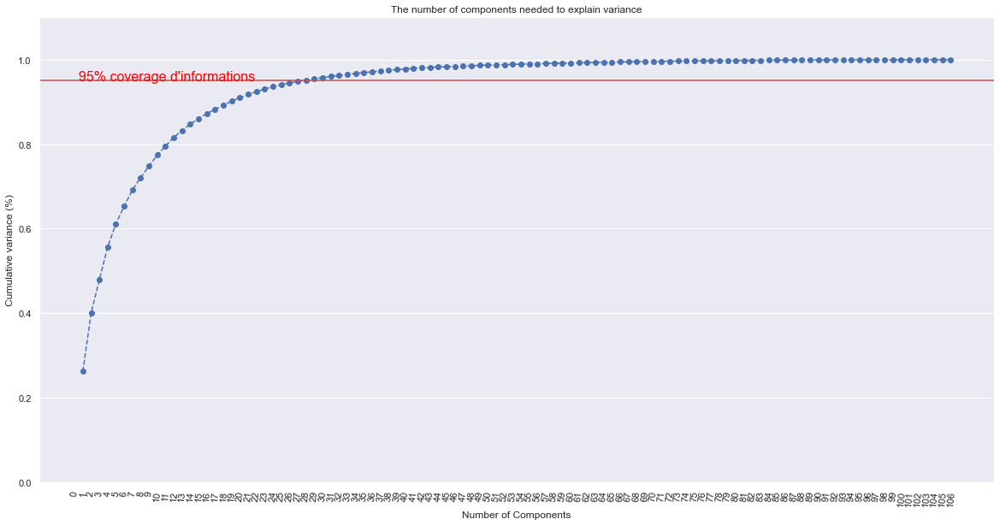

In [203]:
pca = PCA().fit(data_rescaled)

%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (20,10)

fig, ax = plt.subplots()
xi = np.arange(1, len(final.columns)+1, step=1)
y = np.cumsum(pca.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, y, marker='o', linestyle='--', color='b')

plt.xlabel('Number of Components')
plt.xticks(np.arange(0, len(final.columns)+1, step=1) , rotation = 84) 
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance')

plt.axhline(y=0.95,color='r', linestyle='-')
plt.text(0.5, 0.95, "95% coverage d'informations", color = 'red', fontsize=16)

ax.grid(axis='x')
plt.show()

## Modèles Machine learning

In [204]:
X = final.drop(['TotalGHGEmissions','SiteEnergyUse(kBtu)'], axis=1)
X.head(3)

,CouncilDistrictCode,LargestPropertyUseTypeGFA,Latitude,Longitude,NumberofBuildings,NumberofFloors,PropertyGFAParking,PropertyGFATotal,SecondLargestPropertyUseTypeGFA,YearBuilt,...,PrimaryPropertyType_SPS-District K-12,PrimaryPropertyType_Self-Storage Facility,PrimaryPropertyType_Self-Storage Facility\n,PrimaryPropertyType_Senior Care Community,PrimaryPropertyType_Small- and Mid-Sized Office,PrimaryPropertyType_Supermarket / Grocery Store,PrimaryPropertyType_Supermarket/Grocery Store,PrimaryPropertyType_University,PrimaryPropertyType_Warehouse,PrimaryPropertyType_Worship Facility
0,7,88434.0,47.612200,-122.337990,1.0,12.0,0,88434,27677.503884,1927,...,0,0,0,0,0,0,0,0,0,0
1,7,83880.0,47.613170,-122.333930,1.0,11.0,15064,103566,15064.000000,1996,...,0,0,0,0,0,0,0,0,0,0
2,7,757243.0,47.623444,-122.334846,1.0,41.0,0,961990,100000.000000,1969,...,0,0,0,0,0,0,0,0,0,0


In [205]:
y = final.TotalGHGEmissions
y

0        249.43
1        263.51
2       2061.48
3       1936.34
4        507.70
         ...   
6715       8.70
6716      31.46
6717     395.26
6718       5.46
6719       6.74
Name: TotalGHGEmissions, Length: 6567, dtype: float64

In [206]:
y.shape

(6567,)

In [207]:
from sklearn.linear_model import LinearRegression
from sklearn.dummy import DummyRegressor 

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0) 
lm = LinearRegression().fit(X_train, y_train) 
lm_dummy_mean = DummyRegressor(strategy = 'mean').fit(X_train, y_train) 
  
lm_dummy_median = DummyRegressor(strategy = 'median').fit(X_train, y_train) 
y_predict = lm.predict(X_test) 
y_predict_dummy_mean = lm_dummy_mean.predict(X_test) 
y_predict_dummy_median = lm_dummy_median.predict(X_test) 

In [208]:
print("\nMean squared error (dummy): {:.2f}".format(mean_squared_error(y_test,                                                                   y_predict_dummy_mean))) 
print("Mean squared error (linear model): {:.2f}".format(mean_squared_error(y_test, y_predict)))

print("\nMedian absolute error (dummy): {:.2f}".format(median_absolute_error(y_test,y_predict_dummy_median))) 
print("Median absolute error (linear model): {:.2f}".format(median_absolute_error(y_test, y_predict))) 
  
print("\nr2_score (dummy mean): {:.2f}".format(r2_score(y_test, y_predict_dummy_mean))) 
print("r2_score (dummy median): {:.2f}".format(r2_score(y_test, y_predict_dummy_median))) 
print("r2_score (linear model): {:.2f}".format(r2_score(y_test, y_predict))) 


Mean squared error (dummy): 131264.36
Mean squared error (linear model): 47433.04

Median absolute error (dummy): 27.32
Median absolute error (linear model): 35.69

r2_score (dummy mean): -0.00
r2_score (dummy median): -0.03
r2_score (linear model): 0.64


### The importance of the features

In [209]:
import eli5
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(lm, random_state=1).fit(X, y)
eli5.show_weights(perm, feature_names = X.columns.tolist())

Weight,Feature
0.5100 ± 0.0167,LargestPropertyUseTypeGFA
0.4885 ± 0.0111,PrimaryPropertyType_Hospital
0.2682 ± 0.0104,BuildingType_Multifamily LR (1-4)
0.1908 ± 0.0106,BuildingType_NonResidential
0.1816 ± 0.0091,BuildingType_Multifamily MR (5-9)
0.0615 ± 0.0060,PrimaryPropertyType_Low-Rise Multifamily
0.0450 ± 0.0057,PrimaryPropertyType_Hotel
0.0443 ± 0.0024,PrimaryPropertyType_Mid-Rise Multifamily
0.0415 ± 0.0040,useSteam
0.0371 ± 0.0051,PropertyGFAParking


### Hyperparamers

In [211]:
from sklearn.metrics import plot_confusion_matrix


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Paramters Random forest regressor
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 400, num = 2)]
max_features = ['auto', 'sqrt']
max_depth = [int(x) for x in np.linspace(10, 60, num = 5)]
max_depth.append(None)
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]
bootstrap = [True, False]


model_params = {
    'Ridge': {
            'model': Ridge(),
            'params' : {
                'alpha':[1,0.1,0.01,0.001,0,10,200,50,500],
                'fit_intercept': [True,False]
            }
        },
    'LinearRegression':{
        'model':LinearRegression(),
        'params': {
            'fit_intercept':[True,False], 
            'normalize':[True,False], 
            'copy_X':[True, False]
        }
    },
    'Lasso' : {
        'model': Lasso(),
        'params': {
            'alpha':[1,0.1,0.01,0.001,0,10,200,50,500],
            'fit_intercept': [True,False],
            'normalize':[True,False]
        }
    },
}

scores = []

for model_name, mp in model_params.items():
    clf =  GridSearchCV(mp['model'], mp['params'], cv=5, return_train_score=False)
    clf.fit(X_train, y_train)
    scores.append({
        'model': model_name,
        'best_score': clf.best_score_,
        'best_params': clf.best_params_
    })

# To display the whole row 
pd.set_option('display.max_colwidth', -1)

df = pd.DataFrame(scores,columns=['model','best_score','best_params'])


D:\Anconda\lib\site-packages\sklearn\linear_model\_ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=4.37262e-17): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True,
D:\Anconda\lib\site-packages\sklearn\linear_model\_ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=5.10558e-17): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True,
D:\Anconda\lib\site-packages\sklearn\linear_model\_ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=4.4994e-17): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True,
D:\Anconda\lib\site-packages\sklearn\linear_model\_ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=4.49557e-17): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True,
D:\Anconda\lib\site-packages\sklearn\linear_model\_ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=4.77762e-17): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True,
D:\Anconda\lib\site-packag

D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 125725919.8316788, tolerance: 76993.56731035221
  model = cd_fast.enet_coordinate_descent(
D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 123984718.84544891, tolerance: 77676.57560429284
  model = cd_fast.enet_coordinate_descent(
D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 117823908.98974594, tolerance: 79481.73663774283
  model = cd_fast.enet_coordinate_descent(
D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to incre

D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 122796904.23649286, tolerance: 79632.18999305285
  model = cd_fast.enet_coordinate_descent(
D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 121604163.53677718, tolerance: 76993.56731035221
  model = cd_fast.enet_coordinate_descent(
D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 119626733.8226242, tolerance: 77676.57560429284
  model = cd_fast.enet_coordinate_descent(
D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to incre

D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 122653045.08608717, tolerance: 74365.41544184806
  model = cd_fast.enet_coordinate_descent(
D:\Anconda\lib\site-packages\sklearn\model_selection\_validation.py:531: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 121458927.33778037, tolerance: 71591.5772143882
  model 

D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 121525474.6068793, tolerance: 76993.56731035221
  model = cd_fast.enet_coordinate_descent(
D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 223703077.7837553, tolerance: 77676.57560429284
  model = cd_fast.enet_coordinate_descent(
D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 222587170.07268777, tolerance: 79632.18999305285
  model = cd_fast.enet_coordinate_descent(
D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increa

In [212]:
df

,model,best_score,best_params
0,Ridge,0.634739,"{'alpha': 1, 'fit_intercept': False}"
1,LinearRegression,0.633093,"{'copy_X': True, 'fit_intercept': True, 'normalize': False}"
2,Lasso,0.623720,"{'alpha': 0.1, 'fit_intercept': False, 'normalize': True}"


In [47]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV


parameters = {
    'n_estimators' : [10,50,100,300,500], 
    'min_samples_leaf' : [1,3,5,10], 
    'max_features': ['auto', 'sqrt'] 
}

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)


rfr_search = GridSearchCV(RandomForestRegressor(),
                               param_grid = parameters,
                              verbose=2,
                               cv=5)

rfr_search.fit(X_train, y_train)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 5 folds for each of 40 candidates, totalling 200 fits
[CV] max_features=auto, min_samples_leaf=1, n_estimators=10 ..........
[CV]  max_features=auto, min_samples_leaf=1, n_estimators=10, total=   0.7s
[CV] max_features=auto, min_samples_leaf=1, n_estimators=10 ..........


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s remaining:    0.0s


[CV]  max_features=auto, min_samples_leaf=1, n_estimators=10, total=   0.6s
[CV] max_features=auto, min_samples_leaf=1, n_estimators=10 ..........
[CV]  max_features=auto, min_samples_leaf=1, n_estimators=10, total=   0.5s
[CV] max_features=auto, min_samples_leaf=1, n_estimators=10 ..........
[CV]  max_features=auto, min_samples_leaf=1, n_estimators=10, total=   0.5s
[CV] max_features=auto, min_samples_leaf=1, n_estimators=10 ..........
[CV]  max_features=auto, min_samples_leaf=1, n_estimators=10, total=   0.5s
[CV] max_features=auto, min_samples_leaf=1, n_estimators=50 ..........
[CV]  max_features=auto, min_samples_leaf=1, n_estimators=50, total=   2.6s
[CV] max_features=auto, min_samples_leaf=1, n_estimators=50 ..........
[CV]  max_features=auto, min_samples_leaf=1, n_estimators=50, total=   2.6s
[CV] max_features=auto, min_samples_leaf=1, n_estimators=50 ..........
[CV]  max_features=auto, min_samples_leaf=1, n_estimators=50, total=   2.6s
[CV] max_features=auto, min_samples_leaf=1

[CV]  max_features=auto, min_samples_leaf=5, n_estimators=50, total=   1.7s
[CV] max_features=auto, min_samples_leaf=5, n_estimators=50 ..........
[CV]  max_features=auto, min_samples_leaf=5, n_estimators=50, total=   1.7s
[CV] max_features=auto, min_samples_leaf=5, n_estimators=50 ..........
[CV]  max_features=auto, min_samples_leaf=5, n_estimators=50, total=   1.7s
[CV] max_features=auto, min_samples_leaf=5, n_estimators=100 .........
[CV]  max_features=auto, min_samples_leaf=5, n_estimators=100, total=   3.4s
[CV] max_features=auto, min_samples_leaf=5, n_estimators=100 .........
[CV]  max_features=auto, min_samples_leaf=5, n_estimators=100, total=   3.4s
[CV] max_features=auto, min_samples_leaf=5, n_estimators=100 .........
[CV]  max_features=auto, min_samples_leaf=5, n_estimators=100, total=   3.3s
[CV] max_features=auto, min_samples_leaf=5, n_estimators=100 .........
[CV]  max_features=auto, min_samples_leaf=5, n_estimators=100, total=   3.3s
[CV] max_features=auto, min_samples_le

[CV]  max_features=sqrt, min_samples_leaf=1, n_estimators=100, total=   1.0s
[CV] max_features=sqrt, min_samples_leaf=1, n_estimators=100 .........
[CV]  max_features=sqrt, min_samples_leaf=1, n_estimators=100, total=   1.0s
[CV] max_features=sqrt, min_samples_leaf=1, n_estimators=300 .........
[CV]  max_features=sqrt, min_samples_leaf=1, n_estimators=300, total=   3.0s
[CV] max_features=sqrt, min_samples_leaf=1, n_estimators=300 .........
[CV]  max_features=sqrt, min_samples_leaf=1, n_estimators=300, total=   3.1s
[CV] max_features=sqrt, min_samples_leaf=1, n_estimators=300 .........
[CV]  max_features=sqrt, min_samples_leaf=1, n_estimators=300, total=   3.1s
[CV] max_features=sqrt, min_samples_leaf=1, n_estimators=300 .........
[CV]  max_features=sqrt, min_samples_leaf=1, n_estimators=300, total=   3.1s
[CV] max_features=sqrt, min_samples_leaf=1, n_estimators=300 .........
[CV]  max_features=sqrt, min_samples_leaf=1, n_estimators=300, total=   3.1s
[CV] max_features=sqrt, min_samples

[CV]  max_features=sqrt, min_samples_leaf=5, n_estimators=300, total=   1.9s
[CV] max_features=sqrt, min_samples_leaf=5, n_estimators=500 .........
[CV]  max_features=sqrt, min_samples_leaf=5, n_estimators=500, total=   3.1s
[CV] max_features=sqrt, min_samples_leaf=5, n_estimators=500 .........
[CV]  max_features=sqrt, min_samples_leaf=5, n_estimators=500, total=   3.0s
[CV] max_features=sqrt, min_samples_leaf=5, n_estimators=500 .........
[CV]  max_features=sqrt, min_samples_leaf=5, n_estimators=500, total=   2.7s
[CV] max_features=sqrt, min_samples_leaf=5, n_estimators=500 .........
[CV]  max_features=sqrt, min_samples_leaf=5, n_estimators=500, total=   2.6s
[CV] max_features=sqrt, min_samples_leaf=5, n_estimators=500 .........
[CV]  max_features=sqrt, min_samples_leaf=5, n_estimators=500, total=   2.6s
[CV] max_features=sqrt, min_samples_leaf=10, n_estimators=10 .........
[CV]  max_features=sqrt, min_samples_leaf=10, n_estimators=10, total=   0.0s
[CV] max_features=sqrt, min_samples

[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed: 14.1min finished


GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [1, 3, 5, 10],
                         'n_estimators': [10, 50, 100, 300, 500]},
             verbose=2)

In [48]:
rfr_search.best_params_

{'max_features': 'auto', 'min_samples_leaf': 1, 'n_estimators': 100}

In [49]:
rfr_search.best_score_

0.8160165790736755

<b> Prédication de consumation d'énergie </b>

In [50]:
y = final['SiteEnergyUse(kBtu)']

In [51]:
from sklearn.linear_model import LinearRegression
from sklearn.dummy import DummyRegressor 

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0) 
lm = LinearRegression().fit(X_train, y_train) 
lm_dummy_mean = DummyRegressor(strategy = 'mean').fit(X_train, y_train) 
  
lm_dummy_median = DummyRegressor(strategy = 'median').fit(X_train, y_train) 
y_predict = lm.predict(X_test) 
y_predict_dummy_mean = lm_dummy_mean.predict(X_test) 
y_predict_dummy_median = lm_dummy_median.predict(X_test) 

In [52]:
print("\nMean squared error (dummy): {:.2f}".format(mean_squared_error(y_test,                                                                   y_predict_dummy_mean))) 
print("Mean squared error (linear model): {:.2f}".format(mean_squared_error(y_test, y_predict)))

print("\nMedian absolute error (dummy): {:.2f}".format(median_absolute_error(y_test,y_predict_dummy_median))) 
print("Median absolute error (linear model): {:.2f}".format(median_absolute_error(y_test, y_predict))) 
  
print("\nr2_score (dummy mean): {:.2f}".format(r2_score(y_test, y_predict_dummy_mean))) 
print("r2_score (dummy median): {:.2f}".format(r2_score(y_test, y_predict_dummy_median))) 
print("r2_score (linear model): {:.2f}".format(r2_score(y_test, y_predict))) 


Mean squared error (dummy): 108902742203438.03
Mean squared error (linear model): 31253499323290.74

Median absolute error (dummy): 1081571.50
Median absolute error (linear model): 1101915.16

r2_score (dummy mean): -0.00
r2_score (dummy median): -0.07
r2_score (linear model): 0.71


In [53]:
from sklearn.metrics import plot_confusion_matrix


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

model_params = {
    'Ridge': {
            'model': Ridge(),
            'params' : {
                'alpha':[1,0.1,0.01,0.001,0,10,200,50,500],
                'fit_intercept': [True,False]
            }
        },
    'LinearRegression':{
        'model':LinearRegression(),
        'params': {
            'fit_intercept':[True,False], 
            'normalize':[True,False], 
            'copy_X':[True, False]
        }
    },
    'Lasso' : {
        'model': Lasso(),
        'params': {
            'alpha':[1,0.1,0.01,0.001,0,10,200,50,500],
            'fit_intercept': [True,False],
            'normalize':[True,False]
        }
    },

}

scores = []

for model_name, mp in model_params.items():
    clf =  GridSearchCV(mp['model'], mp['params'], cv=5, return_train_score=False)
    clf.fit(X_train, y_train)
    scores.append({
        'model': model_name,
        'best_score': clf.best_score_,
        'best_params': clf.best_params_
    })

# To display the whole row 
pd.set_option('display.max_colwidth', -1)

df = pd.DataFrame(scores,columns=['model','best_score','best_params'])

D:\Anconda\lib\site-packages\sklearn\linear_model\_ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=4.37262e-17): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True,
D:\Anconda\lib\site-packages\sklearn\linear_model\_ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=5.10558e-17): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True,
D:\Anconda\lib\site-packages\sklearn\linear_model\_ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=4.4994e-17): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True,
D:\Anconda\lib\site-packages\sklearn\linear_model\_ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=4.49557e-17): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True,
D:\Anconda\lib\site-packages\sklearn\linear_model\_ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=4.77762e-17): result may not be accurate.
  return linalg.solve(A, Xy, sym_pos=True,
D:\Anconda\lib\site-packag

D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.0728819216984322e+17, tolerance: 100041208595373.34
  model = cd_fast.enet_coordinate_descent(
D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.690447479700608e+16, tolerance: 97159495533795.0
  model = cd_fast.enet_coordinate_descent(
D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.0828649695551162e+17, tolerance: 98913951420850.61
  model = cd_fast.enet_coordinate_descent(
D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might w

D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.0751680475263179e+17, tolerance: 80100825855907.25
  model = cd_fast.enet_coordinate_descent(
D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.0722014825685949e+17, tolerance: 88790626168135.94
  model = cd_fast.enet_coordinate_descent(
D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.679752005852619e+16, tolerance: 86464336669900.8
  model = cd_fast.enet_coordinate_descent(
D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might wa

D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.063975609078987e+17, tolerance: 93715071632869.69
  model = cd_fast.enet_coordinate_descent(
D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.0788357155817611e+17, tolerance: 91189483485780.39
  model = cd_fast.enet_coordinate_descent(
D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.0728490909790189e+17, tolerance: 100041208595373.34
  model = cd_fast.enet_coordinate_descent(
D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might 

D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.0628731308397472e+17, tolerance: 82795763397486.83
  model = cd_fast.enet_coordinate_descent(
D:\Anconda\lib\site-packages\sklearn\model_selection\_validation.py:531: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  model = cd_fast.enet_coordinate_descent(
D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.0780092056667424e+17, tolerance: 80100825855907.25

D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.078835688307641e+17, tolerance: 91189483485780.39
  model = cd_fast.enet_coordinate_descent(
D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 590350194373728.0, tolerance: 88790626168135.94
  model = cd_fast.enet_coordinate_descent(
D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 92142201085728.0, tolerance: 86464336669900.8
  model = cd_fast.enet_coordinate_descent(
D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to incre

D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.0785590259115874e+17, tolerance: 100041208595373.34
  model = cd_fast.enet_coordinate_descent(
D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.743252658727443e+16, tolerance: 97159495533795.0
  model = cd_fast.enet_coordinate_descent(
D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.0882114977959947e+17, tolerance: 98913951420850.61
  model = cd_fast.enet_coordinate_descent(
D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might w

D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.0859388649211618e+17, tolerance: 100041208595373.34
  model = cd_fast.enet_coordinate_descent(
D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9.815170793585301e+16, tolerance: 97159495533795.0
  model = cd_fast.enet_coordinate_descent(
D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.0954264398184835e+17, tolerance: 98913951420850.61
  model = cd_fast.enet_coordinate_descent(
D:\Anconda\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might w

In [213]:
df

,model,best_score,best_params
0,Ridge,0.634739,"{'alpha': 1, 'fit_intercept': False}"
1,LinearRegression,0.633093,"{'copy_X': True, 'fit_intercept': True, 'normalize': False}"
2,Lasso,0.623720,"{'alpha': 0.1, 'fit_intercept': False, 'normalize': True}"


As random forest classifier came from another machine learning family. I separat its hyperparameter optimization

In [ ]:
parameters = {
    'n_estimators' : [10,50,100,300,500], 
    'min_samples_leaf' : [1,3,5,10], 
    'max_features': ['auto', 'sqrt'] 
}

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)


rfr_search = GridSearchCV(RandomForestRegressor(),
                               param_grid = parameters,
                              verbose=2,
                               cv=5)

rfr_search.fit(X_train, y_train)

Fitting 5 folds for each of 40 candidates, totalling 200 fits
[CV] max_features=auto, min_samples_leaf=1, n_estimators=10 ..........


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  max_features=auto, min_samples_leaf=1, n_estimators=10, total=   1.0s
[CV] max_features=auto, min_samples_leaf=1, n_estimators=10 ..........


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.9s remaining:    0.0s


[CV]  max_features=auto, min_samples_leaf=1, n_estimators=10, total=   0.6s
[CV] max_features=auto, min_samples_leaf=1, n_estimators=10 ..........
[CV]  max_features=auto, min_samples_leaf=1, n_estimators=10, total=   0.5s
[CV] max_features=auto, min_samples_leaf=1, n_estimators=10 ..........
[CV]  max_features=auto, min_samples_leaf=1, n_estimators=10, total=   0.5s
[CV] max_features=auto, min_samples_leaf=1, n_estimators=10 ..........
[CV]  max_features=auto, min_samples_leaf=1, n_estimators=10, total=   0.5s
[CV] max_features=auto, min_samples_leaf=1, n_estimators=50 ..........
[CV]  max_features=auto, min_samples_leaf=1, n_estimators=50, total=   2.6s
[CV] max_features=auto, min_samples_leaf=1, n_estimators=50 ..........
[CV]  max_features=auto, min_samples_leaf=1, n_estimators=50, total=   2.9s
[CV] max_features=auto, min_samples_leaf=1, n_estimators=50 ..........
[CV]  max_features=auto, min_samples_leaf=1, n_estimators=50, total=   2.6s
[CV] max_features=auto, min_samples_leaf=1

In [56]:
rfr_search.best_params_


{'max_features': 'auto', 'min_samples_leaf': 1, 'n_estimators': 300}

In [57]:
rfr_search.best_score_

0.8171828002555603

As we can see in the table of comparasion between models. Random forest classifier has the highest score. Therefore, it is the most suitable machmodel 